In [114]:
import boto3
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image
from PIL import ImageDraw
from PIL import ImageFont
import io
import IPython
from IPython.display import JSON
import json
from IPython.display import display
import urllib.request

In [115]:
def makeBoundingBoxes(image, blocks, maxboxes=10):
    #image = Image(imageData)
    draw = ImageDraw.Draw(image) 
    imgWidth, imgHeight = image.size  
    for block in blocks:
        #print(json.dumps(block, indent=2))
        labelname = block.get("Text", block["BlockType"])
        #labelconfidence = block["Confidence"]
        
        #for instance in labelDetail["Instances"]:  
            #print("-----------------\n\n****", labelname, " confidence = ", labelconfidence)
            #print(json.dumps(instance, indent=2))            
        box = block['Geometry']['BoundingBox']
        left = imgWidth * box['Left']
        top = imgHeight * box['Top']
        width = imgWidth * box['Width']
        height = imgHeight * box['Height']

        points = (
            (left,top),
            (left + width, top),
            (left + width, top + height),
            (left , top + height),
            (left, top)

        )
        draw.line(points, fill='#00d400', width=2)  
        fnt = ImageFont.load_default().font  
        draw.text((left , top), labelname, font = fnt, align ="left", fill='#00d400')            
    #display(image)
    return image


In [116]:
def getImageAsBytes(imageurl):
    imagedata = urllib.request.urlopen(imageurl).read()
    return imagedata 


In [117]:
def detect_document_text(imageurl):
    imageasbytes = getImageAsBytes(imageurl)
    client = boto3.client('textract')
    response = client.detect_document_text(
        Document={
            'Bytes': imageasbytes
        }
    )
    #print(response)
    return response["Blocks"]

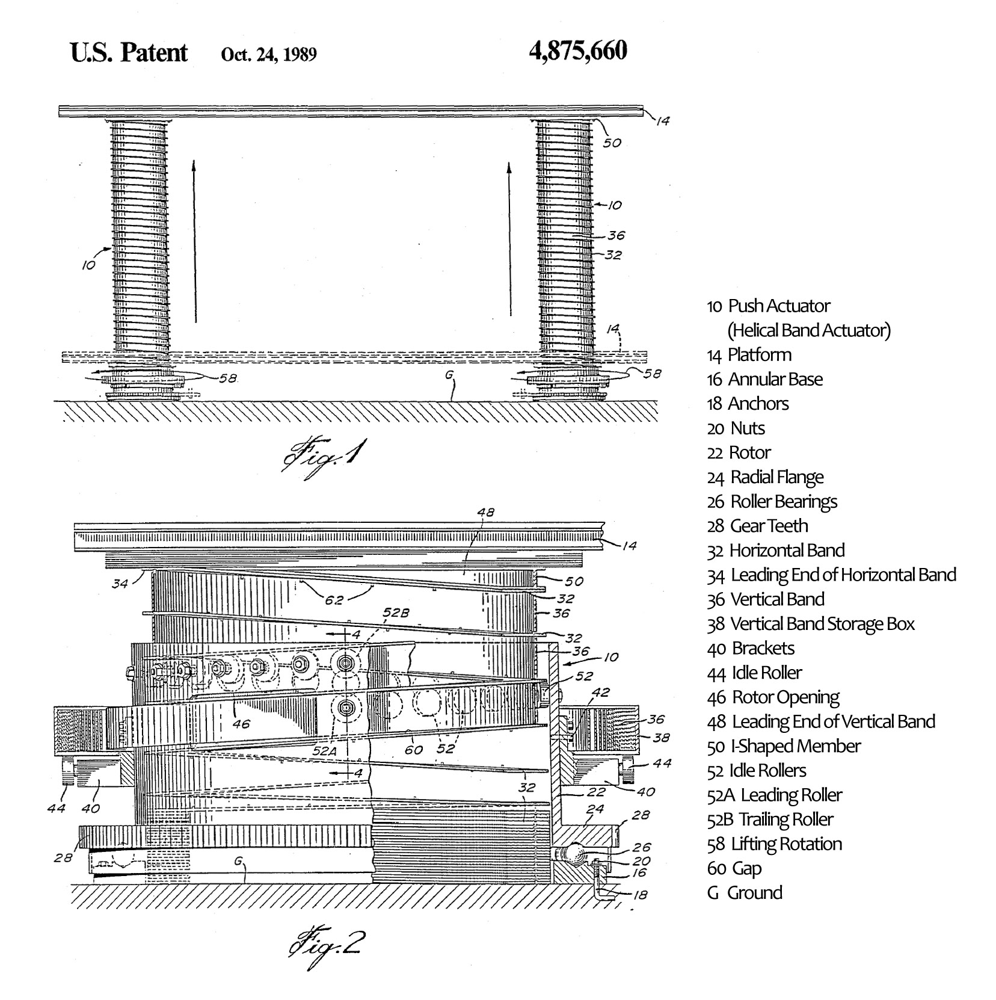

In [118]:
imageurl = "https://upload.wikimedia.org/wikipedia/commons/7/75/Avalon_Drawing.jpg"
imageurl = "https://upload.wikimedia.org/wikipedia/en/0/04/Spiralift_Patent.jpg"
mydata = getImageAsBytes(imageurl)
display(IPython.display.Image(data=mydata))
stream = io.BytesIO(mydata)
img = Image.open(stream)

In [119]:

documentTextBlocks = detect_document_text(imageurl)
#print(json.dumps(documentTextBlocks, indent=2))

In [120]:


newimage = makeBoundingBoxes(img, documentTextBlocks, maxboxes=10)


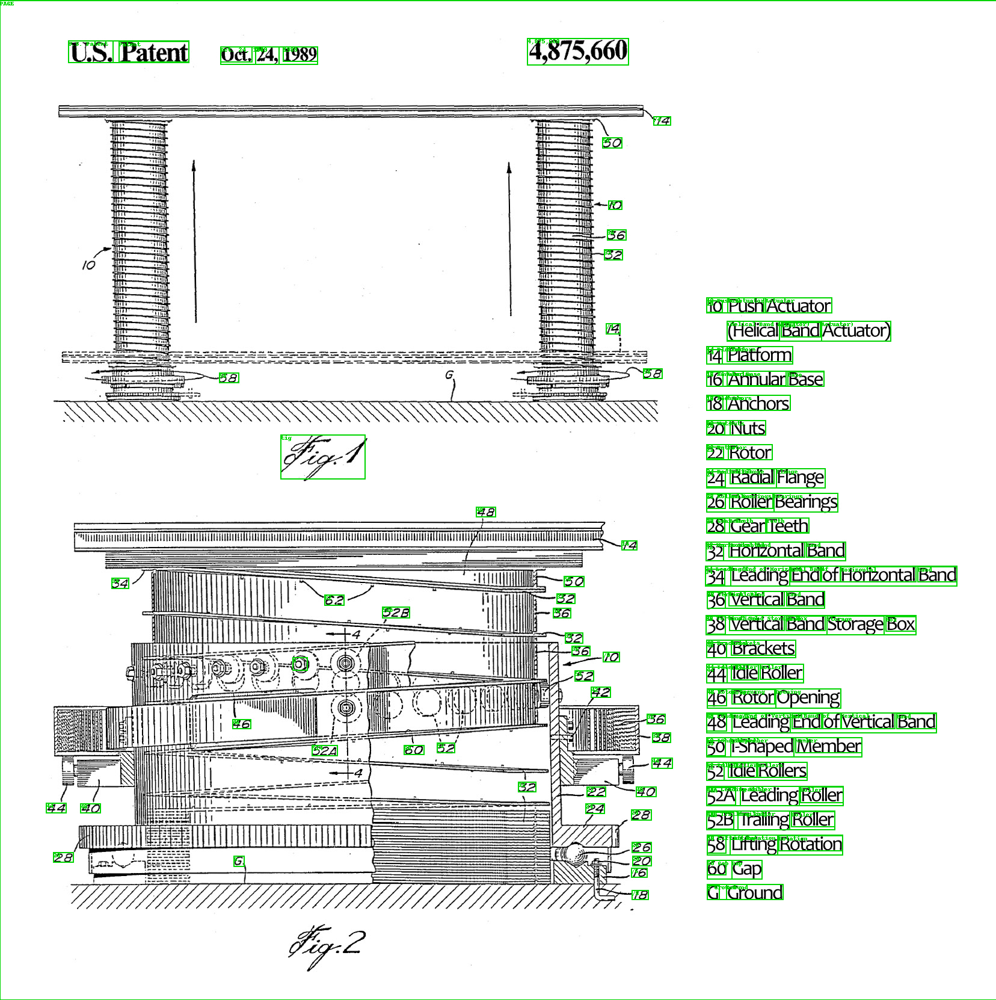

In [121]:
display(newimage)

In [122]:
def analyze_document(imageurl):
    imageasbytes = getImageAsBytes(imageurl)
    client = boto3.client('textract')
    response = client.analyze_document(
        Document={
            'Bytes': imageasbytes
        },
        FeatureTypes=['TABLES', 'FORMS']
    )
    #print(response)
    return response["Blocks"]

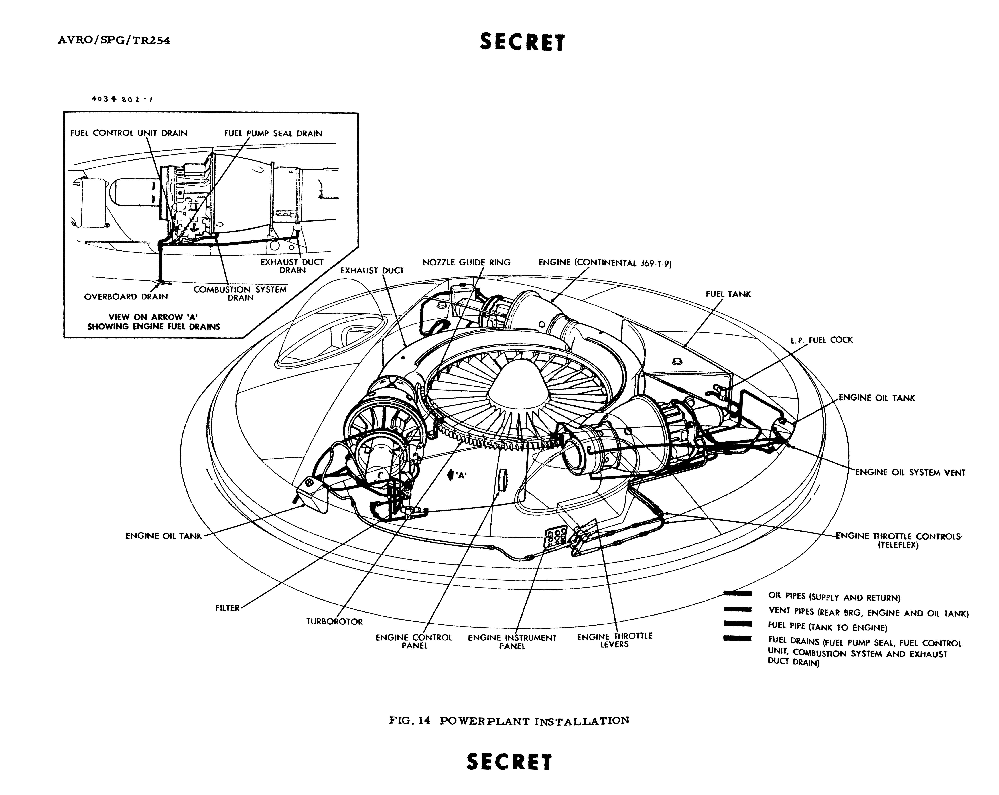

In [123]:
imageurl = "https://upload.wikimedia.org/wikipedia/commons/e/e6/Avrocar_schematic_%28high_resolution%29.jpg"
analyzeDocBlockResults = analyze_document(imageurl) 
#print(json.dumps(analyzeDocBlockResults, indent=2))
mydata = getImageAsBytes(imageurl)
display(IPython.display.Image(data=mydata))
stream = io.BytesIO(mydata)
img = Image.open(stream)

In [124]:
newimage = makeBoundingBoxes(img, analyzeDocBlockResults, maxboxes=10)

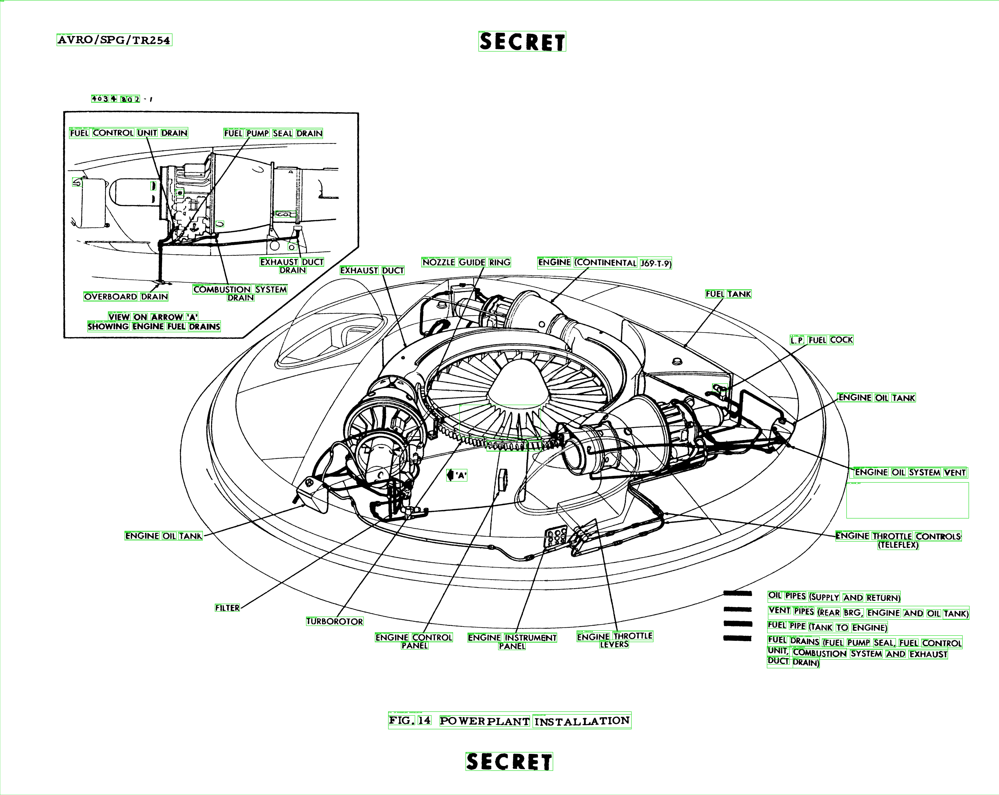

In [125]:
display(newimage)